In [7]:
import warnings
import tensorflow as tf
import tensorflow_datasets as tfds

warnings.filterwarnings("ignore") #필요없는 경고 메시지를 무시함

#train셋을 나누는 과정80:10:10
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)
print(raw_train) #None이 있는 이유는 각 데이터셋의 크기가 다 다르기 때문에
print(raw_validation) #3은 RGB채널의 숫자를 나타냄 (흑/백의 경우 1개의 채널만 있음)
print(raw_test)


<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


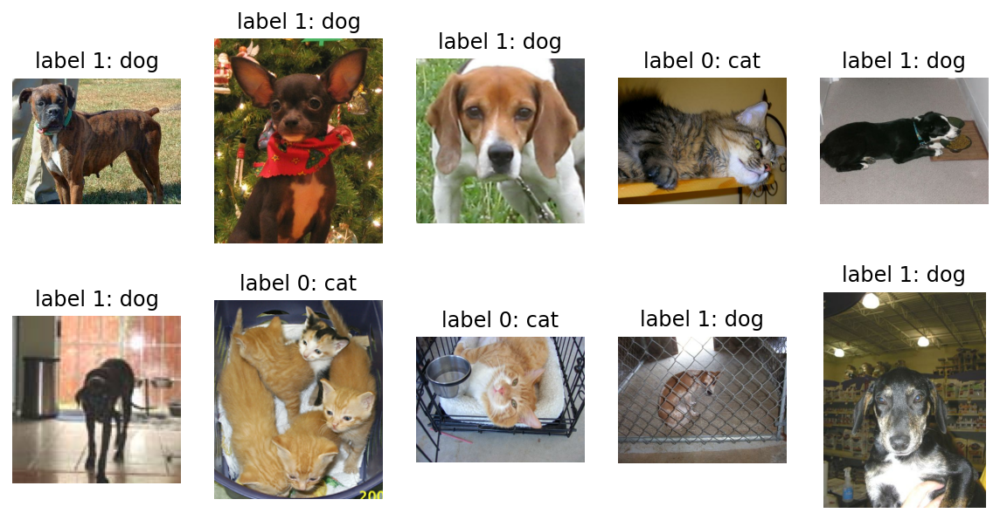

In [14]:
import matplotlib.pyplot as plt

#주피터 노트북에서 사용하는 구문
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.figure(figsize=(10, 5))#(사진의 크기, 사진의 상하간격)

get_label_name = metadata.features['label'].int2str #특징의 라벨이름을 받는다.(강아지는 label_1, 고양이는 label_0)

for idx, (image, label) in enumerate(raw_train.take(10)): #take가 인수로 받은 만큼의 데이터를 추출하여 리턴하는 함수
    plt.subplot(2, 5, idx+1) #2행 5열의 형태로 배열됨
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [19]:
IMG_SIZE = 160 #리사이징할 이미지 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32) #image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 #픽셀값의 scale 수정 (= (255/127.5)-1 ~ (0-127.5)-1 ---> 1 ~ (-1))
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) #이미지 리사이즈
    return image, label

#리스트에 map함수 적용
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train) #리사이징으로 모든 데이터셋의 크기가 160x160으로 변경됨)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


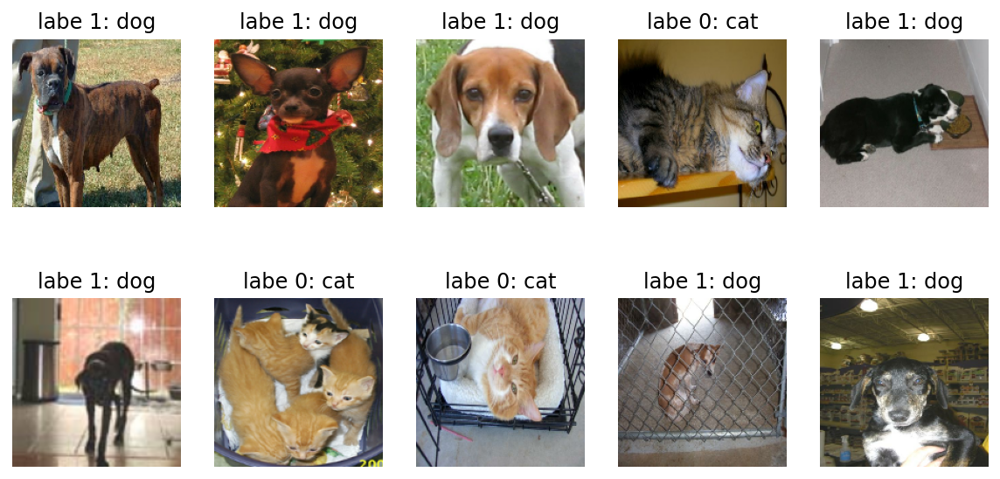

In [18]:
#리사이즈된 이미지를 출력
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2,5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'labe {label}: {get_label_name(label)}')
    plt.axis('off')

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

#모델 생성
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

#생성된 모델의 전체 정보
model.summary() #이미지의 크기는 점점 작아지고 채널은 점점 늘어난다.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [23]:
#평탄화
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
print(image) #일반적인 2x2 행렬
print(image.flatten()) #flatten으로 평탄화 작업된 행렬

(2, 2)
[[1 2]
 [3 4]]
[1 2 3 4]


In [34]:
#모델 학습
learning_rate = 0.0001 #학습률
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate), #optimizer 학습을 어떤 방식으로 시킬 것인지
             loss=tf.keras.losses.sparse_categorical_crossentropy, #loss 모델이 학습해나가는 방향
             metrics=['accuracy']) #metrics 모델의 성능을 평가하는 척도

BATCH_SIZE = 32 #한 스텝에 학습시킬 데이터의 개수
SHUFFLE_BUFFER_SIZE = 1000
#한 스텝이란?  --> 수많은 데이터중 랜덤으로 뿌려줄 데이터의 크기가 BATCH_SIZE이다.
#SHUFFLE_BUFFER_SIZE가 데이터를 적절히 섞어준다는데 어떻게 섞어주는가? --> 셔플해줄 데이터의 크기를 나타낸다.

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE) #데이터를 섞어주는 구문
validation_batches = validation.batch(BATCH_SIZE) #검증 배치
test_batches = test.batch(BATCH_SIZE) #시험 배치

validation_steps = 20 #한 스텝에 확인할 데이터의 개수
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0)) #loss 약 70%
print("initial accuracy: {:.2f}".format(accuracy0)) #정확도 약 45% --> 매우 안좋은 성능

 9/20 [============>.................] - ETA: 0s - loss: 1.0029 - accuracy: 0.7118

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 1s 31ms/step - loss: 0.9414 - accuracy: 0.7375
initial loss: 0.94
initial accuracy: 0.74


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


In [26]:
EPOCHS = 10 #몇 번을 학습시킬 것인가에 대한 파라미터
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
170/582 [=======>......................] - ETA: 16s - loss: 0.7031 - accuracy: 0.5945

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.6891 - accuracy: 0.6060

212/582 [=========>....................] - ETA: 15s - loss: 0.6853 - accuracy: 0.6082

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.6664 - accuracy: 0.6210

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.6241 - accuracy: 0.6552

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.6220 - accuracy: 0.6571

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.6198 - accuracy: 0.6587

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.6165 - accuracy: 0.6621

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.6167 - accuracy: 0.6614

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.6122 - accuracy: 0.6651

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 44ms/step - loss: 0.6122 - accuracy: 0.6651 - val_loss: 0.5719 - val_accuracy: 0.7012
Epoch 2/10
170/582 [=======>......................] - ETA: 17s - loss: 0.5222 - accuracy: 0.7379

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.5188 - accuracy: 0.7420

212/582 [=========>....................] - ETA: 15s - loss: 0.5203 - accuracy: 0.7404

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.5144 - accuracy: 0.7444

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.4954 - accuracy: 0.7583

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.4951 - accuracy: 0.7591

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.4943 - accuracy: 0.7599

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.4916 - accuracy: 0.7613

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.4913 - accuracy: 0.7611

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.4896 - accuracy: 0.7617

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.4896 - accuracy: 0.7617 - val_loss: 0.5023 - val_accuracy: 0.7640
Epoch 3/10
169/582 [=======>......................] - ETA: 17s - loss: 0.4539 - accuracy: 0.7886

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.4521 - accuracy: 0.7888

213/582 [=========>....................] - ETA: 15s - loss: 0.4516 - accuracy: 0.7902

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.4423 - accuracy: 0.7954

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4305 - accuracy: 0.8019

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4297 - accuracy: 0.8028

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4284 - accuracy: 0.8036

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4267 - accuracy: 0.8051

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4259 - accuracy: 0.8054

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4254 - accuracy: 0.8053

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.4253 - accuracy: 0.8053 - val_loss: 0.4888 - val_accuracy: 0.7730
Epoch 4/10
169/582 [=======>......................] - ETA: 16s - loss: 0.3946 - accuracy: 0.8214

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 15s - loss: 0.3935 - accuracy: 0.8209

213/582 [=========>....................] - ETA: 15s - loss: 0.3926 - accuracy: 0.8204

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3873 - accuracy: 0.8238

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3745 - accuracy: 0.8316

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3745 - accuracy: 0.8323

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3733 - accuracy: 0.8329

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3720 - accuracy: 0.8338

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3710 - accuracy: 0.8344

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3697 - accuracy: 0.8346

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.3696 - accuracy: 0.8347 - val_loss: 0.4961 - val_accuracy: 0.7713
Epoch 5/10
170/582 [=======>......................] - ETA: 17s - loss: 0.3371 - accuracy: 0.8502

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.3354 - accuracy: 0.8537

212/582 [=========>....................] - ETA: 15s - loss: 0.3348 - accuracy: 0.8547

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.3295 - accuracy: 0.8567

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3182 - accuracy: 0.8630

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3181 - accuracy: 0.8632

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3180 - accuracy: 0.8631

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3156 - accuracy: 0.8646

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3146 - accuracy: 0.8652

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3146 - accuracy: 0.8650

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3146 - accuracy: 0.8651 - val_loss: 0.5336 - val_accuracy: 0.7670
Epoch 6/10
169/582 [=======>......................] - ETA: 17s - loss: 0.2823 - accuracy: 0.8794

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.2811 - accuracy: 0.8799

213/582 [=========>....................] - ETA: 15s - loss: 0.2800 - accuracy: 0.8809

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2753 - accuracy: 0.8851

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.2623 - accuracy: 0.8908

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.2618 - accuracy: 0.8914

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.2620 - accuracy: 0.8914

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.2606 - accuracy: 0.8920

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.2604 - accuracy: 0.8920

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.2597 - accuracy: 0.8926

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.2598 - accuracy: 0.8924 - val_loss: 0.5520 - val_accuracy: 0.7532
Epoch 7/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2290 - accuracy: 0.9083

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.2275 - accuracy: 0.9097

212/582 [=========>....................] - ETA: 15s - loss: 0.2271 - accuracy: 0.9098

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2217 - accuracy: 0.9115

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2106 - accuracy: 0.9173

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2099 - accuracy: 0.9177

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.2090 - accuracy: 0.9181

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2087 - accuracy: 0.9182

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2081 - accuracy: 0.9185

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2060 - accuracy: 0.9197

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.2060 - accuracy: 0.9197 - val_loss: 0.5604 - val_accuracy: 0.7756
Epoch 8/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1761 - accuracy: 0.9364

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1768 - accuracy: 0.9352

212/582 [=========>....................] - ETA: 15s - loss: 0.1762 - accuracy: 0.9362

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1695 - accuracy: 0.9391

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1629 - accuracy: 0.9419

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1625 - accuracy: 0.9419

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1614 - accuracy: 0.9425

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1601 - accuracy: 0.9429

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1596 - accuracy: 0.9432

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1583 - accuracy: 0.9435

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.1582 - accuracy: 0.9436 - val_loss: 0.6148 - val_accuracy: 0.7678
Epoch 9/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1308 - accuracy: 0.9548

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1293 - accuracy: 0.9562

212/582 [=========>....................] - ETA: 15s - loss: 0.1287 - accuracy: 0.9565

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1254 - accuracy: 0.9582

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1188 - accuracy: 0.9601

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.1176 - accuracy: 0.9604

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1179 - accuracy: 0.9603

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.1162 - accuracy: 0.9609

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1154 - accuracy: 0.9614

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1151 - accuracy: 0.9616

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.1150 - accuracy: 0.9617 - val_loss: 0.6703 - val_accuracy: 0.7674
Epoch 10/10
170/582 [=======>......................] - ETA: 17s - loss: 0.0941 - accuracy: 0.9686

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.0950 - accuracy: 0.9683

212/582 [=========>....................] - ETA: 15s - loss: 0.0931 - accuracy: 0.9695

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.0894 - accuracy: 0.9715

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.0855 - accuracy: 0.9732

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.0850 - accuracy: 0.9735

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.0840 - accuracy: 0.9740

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.0836 - accuracy: 0.9742

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.0832 - accuracy: 0.9744

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.0815 - accuracy: 0.9754

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.0817 - accuracy: 0.9752 - val_loss: 0.8755 - val_accuracy: 0.7519


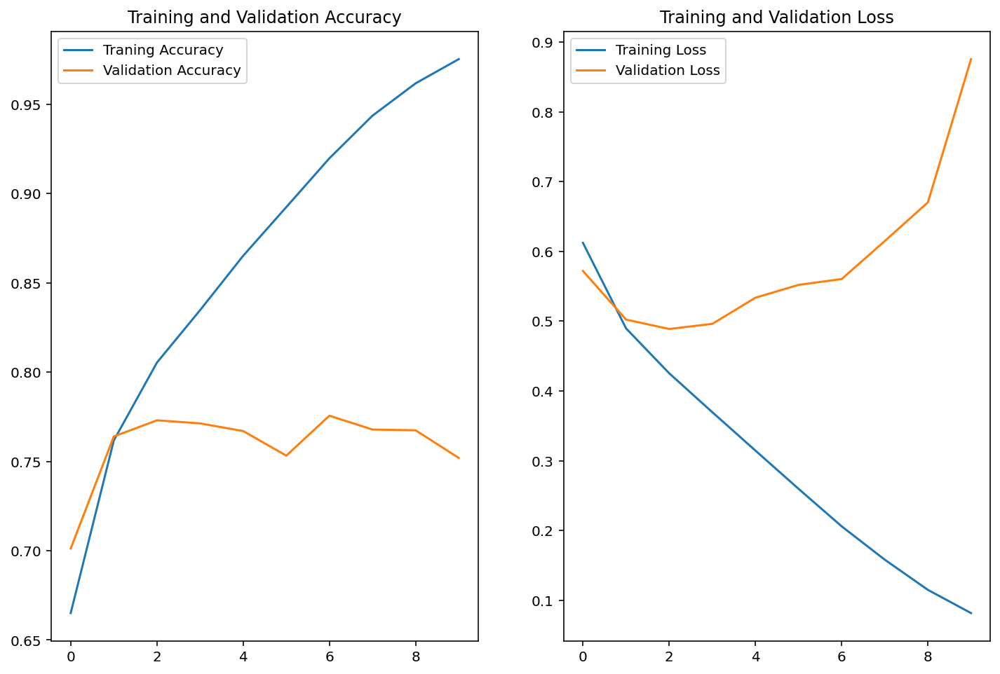

In [31]:
#정확도 그래프
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

#정확도에 대한 그래프
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label = 'Traning Accuracy')
plt.plot(epochs_range, val_acc, label = 'Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
#훈련데이터의 그래프는 안정적인 우상향인데 반해 검증데이터의 그래프는 특정 지점을 기준으로 올라가지 않는다.
#훈련데이터는 현재 학습하는 데이터의 정확도이기 때문에 계속 상승하고 검증데이터는 학습되지 않은 데이터이기 때문에 일정 수준 이상으로 올라갈지 장담할 수 없다.
#이로인해 훈련데이터에만 성능이 좋은 과적합이 발생할 수 있다.

#손실에 대한 그래프
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()
#손실 또한 훈련과 같은 이유이다.

In [40]:
#모델의 예측 결과를 확인
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

#[고양이일 확률, 강아지일 확률] --->[1.0, 0] = 고양이 확률 100%, [0, 1.0] = 강아지 확률 100%
print(predictions)
print('----------------------------------')
#위의 값을 토대로 고양이(0)인지, 강아지(1)인지 높은 값을 반환
predictions = np.argmax(predictions, axis=1)
print(predictions)

[[9.99998569e-01 1.46763341e-06]
 [9.99281585e-01 7.18491909e-04]
 [4.82908964e-01 5.17090976e-01]
 [9.99999881e-01 7.05014642e-08]
 [9.93528426e-01 6.47156965e-03]
 [9.89133179e-01 1.08668795e-02]
 [6.73719794e-02 9.32627976e-01]
 [1.62781954e-01 8.37217987e-01]
 [1.16416521e-01 8.83583486e-01]
 [3.20491642e-01 6.79508328e-01]
 [6.50149062e-02 9.34985101e-01]
 [9.99890566e-01 1.09434157e-04]
 [9.99997139e-01 2.86029854e-06]
 [5.83202578e-04 9.99416828e-01]
 [9.97890890e-01 2.10908242e-03]
 [9.98896718e-01 1.10328407e-03]
 [7.68323541e-01 2.31676430e-01]
 [1.63001171e-03 9.98369992e-01]
 [9.85846698e-01 1.41532514e-02]
 [8.62634301e-01 1.37365669e-01]
 [9.67920542e-01 3.20795290e-02]
 [9.96052504e-01 3.94748943e-03]
 [9.99983072e-01 1.69355899e-05]
 [9.83056962e-01 1.69429816e-02]
 [1.00000000e+00 3.47030813e-08]
 [2.90085018e-01 7.09914982e-01]
 [9.99998450e-01 1.50221081e-06]
 [2.64819056e-01 7.35180914e-01]
 [9.99908686e-01 9.13431868e-05]
 [9.97690320e-01 2.30972469e-03]
 [9.999949

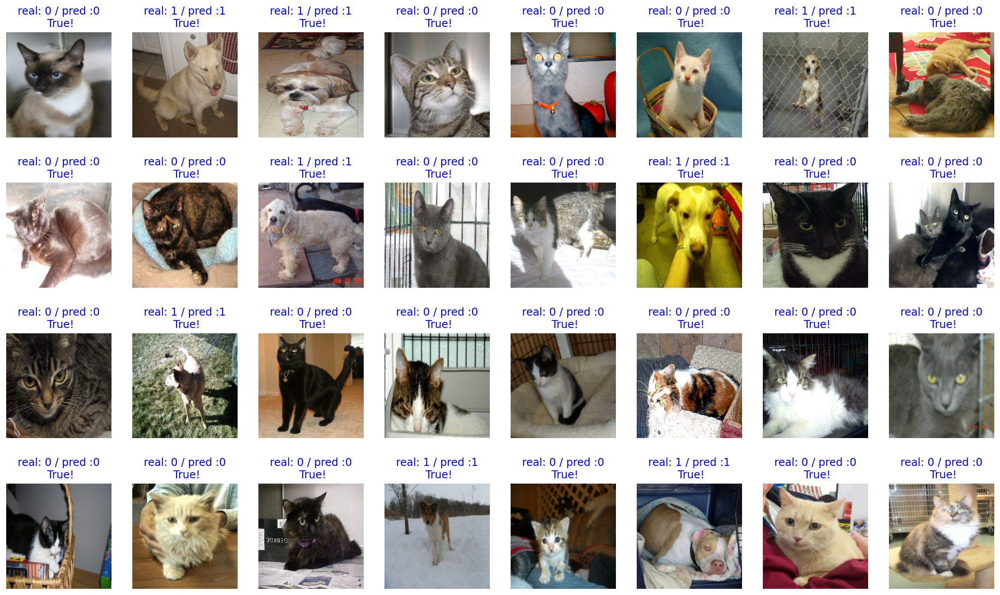

In [70]:
#32장의 이미지들과 32개의 라벨, 32개의 예측을 얻은 값을 시각화
plt.figure(figsize = (20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

#맞춘 경우(True)가 많지만 틀린 경우(False)도 있다. ------> 모델을 학습 시키고 다시 돌렸더니 정확도가 100이 되버렸따....

In [69]:
#정답률 구하기
print(count / 32 * 100)

100.0


In [47]:
#VGG16
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3) #이미지 형태
#모델 생성
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

print(image_batch.shape) #원래 이미지의 형태(이미지 수(32), 높이(160), 너비(160), RGB(3))

feature_batch = base_model(image_batch)
print(feature_batch.shape) #모델을 적용한 이미지 형태 (32, 5, 5, 512) --> 이미지 크기는 줄고 채널이 늘어남 --> 특징벡터라고 명명함

#base-model 의 정보
print(base_model.summary())

(32, 160, 160, 3)
(32, 5, 5, 512)
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D) 

In [50]:
#평탄화 - Golbal Average Pooling (3차원의 벡터가 있을 떄, 겹겹이 쌓여있는 2차원 배열의 평균을 구한 후 하나의 값으로 축소하는 기법)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

#Dense 레이어를 넣어 classifier를 완성
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

#이미지에서 특징을 추출해 base_model에 입력 --> 특징이 추출 --> 추출된 특징 벡터가 global_average_layer를 거쳐 평탄화 --> prediction_layer를 통해 예측 결과 추출
base_model.trainable = False #VGG16에 해당하는 base_model은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 trainable 변수를 False로 설정

(32, 512)
(32, 2)


In [51]:
#최종 모델
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
#최종 모델의 정보
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________
None


In [52]:
#컴파일 과정
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

#학습 전 검증
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))
#약 50%로 하나로 찍는 것과 같은 수치

 6/20 [========>.....................] - ETA: 0s - loss: 0.7311 - accuracy: 0.5417

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7495 - accuracy: 0.5295

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 5s 61ms/step - loss: 0.7518 - accuracy: 0.5297
initial loss: 0.75
initial accuracy: 0.53


In [53]:
#모델 학습
EPOCHS = 5

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 32s - loss: 0.3786 - accuracy: 0.8737

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.3598 - accuracy: 0.8781

210/582 [=========>....................] - ETA: 29s - loss: 0.3533 - accuracy: 0.8807

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.3212 - accuracy: 0.8905

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2687 - accuracy: 0.9048

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2660 - accuracy: 0.9051

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2637 - accuracy: 0.9058

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2589 - accuracy: 0.9073

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2577 - accuracy: 0.9078

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2522 - accuracy: 0.9101

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 57s 96ms/step - loss: 0.2522 - accuracy: 0.9101 - val_loss: 0.1761 - val_accuracy: 0.9252
Epoch 2/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1642 - accuracy: 0.9323

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1619 - accuracy: 0.9337

210/582 [=========>....................] - ETA: 30s - loss: 0.1613 - accuracy: 0.9344

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1635 - accuracy: 0.9335

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1608 - accuracy: 0.9347

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1608 - accuracy: 0.9343

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1611 - accuracy: 0.9340

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1600 - accuracy: 0.9342

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1602 - accuracy: 0.9341

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1591 - accuracy: 0.9350

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 90ms/step - loss: 0.1591 - accuracy: 0.9350 - val_loss: 0.1526 - val_accuracy: 0.9338
Epoch 3/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1436 - accuracy: 0.9396

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1451 - accuracy: 0.9400

210/582 [=========>....................] - ETA: 30s - loss: 0.1446 - accuracy: 0.9406

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1468 - accuracy: 0.9382

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1478 - accuracy: 0.9385

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1477 - accuracy: 0.9384

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1479 - accuracy: 0.9382

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1473 - accuracy: 0.9387

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1474 - accuracy: 0.9386

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1458 - accuracy: 0.9397

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 89ms/step - loss: 0.1458 - accuracy: 0.9397 - val_loss: 0.1457 - val_accuracy: 0.9359
Epoch 4/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1373 - accuracy: 0.9427

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1400 - accuracy: 0.9417

210/582 [=========>....................] - ETA: 30s - loss: 0.1394 - accuracy: 0.9417

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1382 - accuracy: 0.9423

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1402 - accuracy: 0.9416

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1404 - accuracy: 0.9412

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1401 - accuracy: 0.9412

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1398 - accuracy: 0.9413

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1395 - accuracy: 0.9416

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1385 - accuracy: 0.9424

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 90ms/step - loss: 0.1385 - accuracy: 0.9424 - val_loss: 0.1633 - val_accuracy: 0.9295
Epoch 5/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1310 - accuracy: 0.9459

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1332 - accuracy: 0.9455

210/582 [=========>....................] - ETA: 30s - loss: 0.1338 - accuracy: 0.9455

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1352 - accuracy: 0.9446

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1365 - accuracy: 0.9452

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1364 - accuracy: 0.9448

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1363 - accuracy: 0.9446

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1350 - accuracy: 0.9451

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1351 - accuracy: 0.9452

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1341 - accuracy: 0.9458

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 90ms/step - loss: 0.1341 - accuracy: 0.9458 - val_loss: 0.1396 - val_accuracy: 0.9381


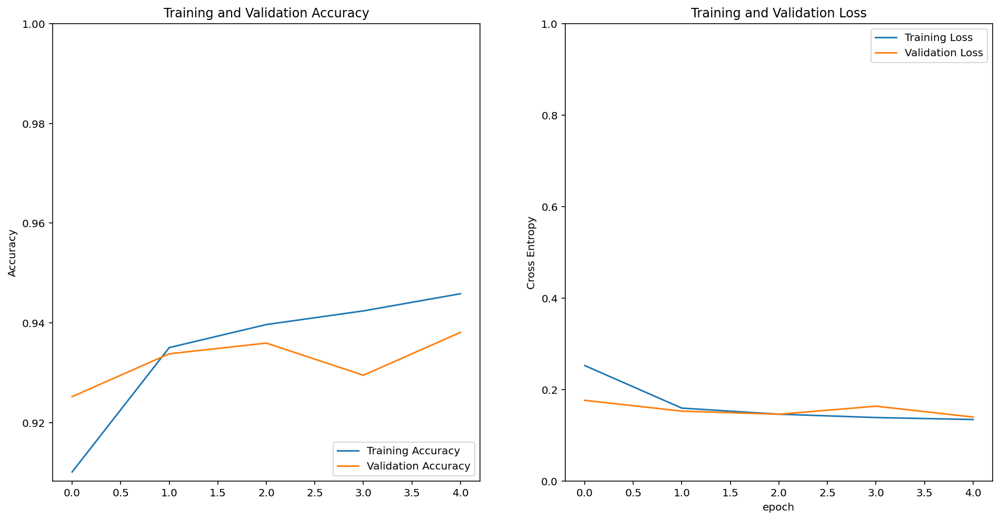

In [54]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

#정확도에 대한 그래프
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

#손실에 대한 그래프
plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#그래프가 양쪽 모두 안정적으로 그려진다.

In [56]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

print(predictions)

predictions = np.argmax(predictions, axis=1)
print(predictions)

[[9.9998879e-01 1.1188234e-05]
 [1.6035435e-01 8.3964562e-01]
 [3.6561143e-01 6.3438857e-01]
 [9.9999607e-01 3.9116935e-06]
 [9.9852031e-01 1.4796602e-03]
 [9.9147731e-01 8.5226335e-03]
 [1.9575888e-04 9.9980432e-01]
 [7.2904629e-01 2.7095369e-01]
 [9.6412992e-01 3.5870142e-02]
 [9.7226214e-01 2.7737800e-02]
 [7.5997974e-05 9.9992394e-01]
 [9.9996912e-01 3.0909749e-05]
 [9.9197972e-01 8.0202632e-03]
 [5.5137552e-06 9.9999452e-01]
 [9.9898702e-01 1.0129652e-03]
 [9.8975021e-01 1.0249801e-02]
 [9.9774939e-01 2.2505492e-03]
 [3.9411079e-02 9.6058893e-01]
 [6.7509443e-01 3.2490557e-01]
 [9.9685752e-01 3.1424940e-03]
 [9.4674730e-01 5.3252667e-02]
 [9.8959512e-01 1.0404867e-02]
 [9.9597919e-01 4.0208339e-03]
 [9.8242861e-01 1.7571384e-02]
 [9.9892706e-01 1.0729085e-03]
 [9.8634458e-01 1.3655460e-02]
 [9.9931061e-01 6.8941904e-04]
 [4.3793045e-02 9.5620698e-01]
 [9.9100995e-01 8.9900885e-03]
 [4.7020547e-02 9.5297945e-01]
 [9.9694413e-01 3.0559017e-03]
 [9.9985516e-01 1.4478229e-04]]
[0 1 1 

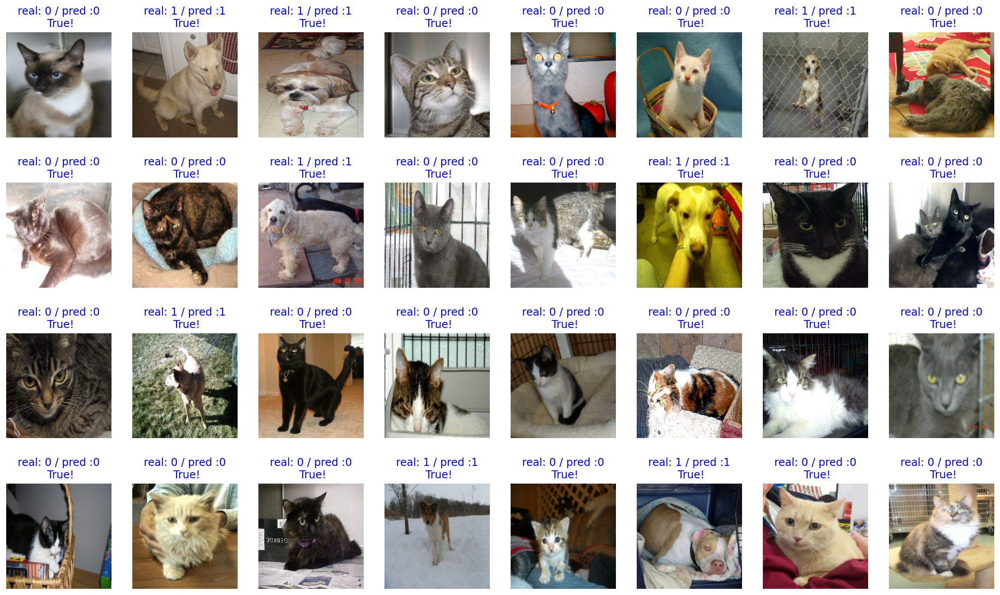

In [71]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')
#정확도가 매우 높아졌다!

In [75]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images" #이미지 경로
print(os.path.exists(img_dir_path))

checkpoint 파일 생성 OK!!
True


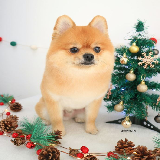

In [81]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

#이미지 생성
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [82]:
#이미지 배열 확인
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [84]:
#모델에 이미지를 삽입
prediction = model.predict(dog_image)
print(prediction)

[[2.7038542e-38 1.0000000e+00]]


This image seems 0% dog, and 100% cat.


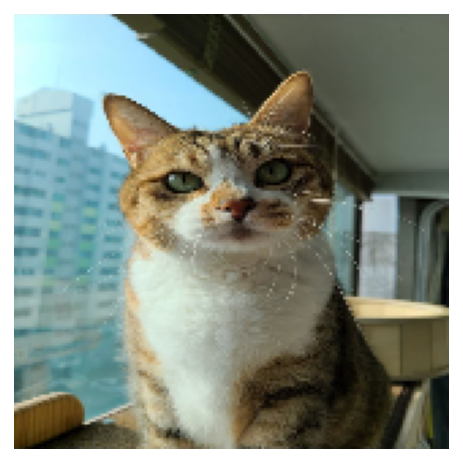

In [87]:
#위의 과정을 함수화
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

#함수 사용 예시
filename = 'my_cat.jpeg'
show_and_predict_image(img_dir_path, filename)